<img src="https://uwe-cyber.github.io/images/uwe_banner.png">

# UFCFEL-15-3 Security Data Analytics and Visualisation
## Portfolio Assignment: Part 3
### Academic year: 2023-24

## Conduct a security investigation into a suspected insider threat
---

**UWEtech** are calling you back once more to help them with their security challenges. They believe that one of their employees has been the cause of their recent security problems, and they believe they may have an insider threat within the company. They enlist your help to examine employee log activity, to see what behaviours deviate from the norm and to identify which user may be acting as a threat to their organisation.

**Dataset:** You will be issued a **unique dataset** based on your UWE student ID. **Failure to use the dataset that corresponds to your student ID will result in zero marks.** Please access the datasets via Blackboard.

**This exercise carries a weight of 45% towards your overall portfolio submission**


### Submission Documents
---

For Part 3 of your portfolio, your complete output file should be saved as:

- **STUDENT_ID-PART3.ipynb**

This should then be included in a ZIP file along with your other two portfolio documents.

The deadline for your portfolio submission is **THURSDAY 11th JANUARY @ 14:00**. 

## DATASET: Load in the data

**Please provide the string below that you have been assigned as given in the spreadsheet available on Blackboard. The directory containing your dataset should be at the same location as your notebook file.**

In [1]:
# PLEASE ENTER THE NAME OF THE DATASET ASSIGNED TO YOU AS INDICATED ON BLACKBOARD
DATASET = 'uwetech-dataset04'

### Function for loading data - do not change

In [2]:
import random
import string
import pandas as pd
import matplotlib.pyplot as plt
import seaborn
import datetime

def load_data(DATASET):
    dataset_list = ['uwetech-dataset01', 'uwetech-dataset02', 'uwetech-dataset03', 'uwetech-dataset04']
    if DATASET in dataset_list:
        email_data = pd.read_csv('./' + DATASET + '/email_data.csv', parse_dates=True, index_col=0)
        file_data = pd.read_csv('./' + DATASET + '/file_data.csv', parse_dates=True, index_col=0)
        web_data = pd.read_csv('./' + DATASET + '/web_data.csv', parse_dates=True, index_col=0)
        login_data = pd.read_csv('./' + DATASET + '/login_data.csv', parse_dates=True, index_col=0)
        usb_data = pd.read_csv('./' + DATASET + '/usb_data.csv', parse_dates=True, index_col=0)
        employee_data = pd.read_csv('./' + DATASET + '/employee_data.csv', index_col=0)
        
        email_data['datetime'] = pd.to_datetime(email_data['datetime'])
        file_data['datetime'] = pd.to_datetime(file_data['datetime'])
        web_data['datetime'] = pd.to_datetime(web_data['datetime'])
        login_data['datetime'] = pd.to_datetime(login_data['datetime'])
        usb_data['datetime'] = pd.to_datetime(usb_data['datetime'])
    else:
        print ("DATASET variable not defined - please refer to Blackboard for DATASET name")
        return
    return employee_data, login_data, usb_data, web_data, file_data, email_data

employee_data, login_data, usb_data, web_data, file_data, email_data = load_data(DATASET)

/var/folders/61/yb7st_9d6c9frlz4phr4vcyh0000gn/T/ipykernel_64258/3678823198.py:11: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  email_data = pd.read_csv('./' + DATASET + '/email_data.csv', parse_dates=True, index_col=0)
/var/folders/61/yb7st_9d6c9frlz4phr4vcyh0000gn/T/ipykernel_64258/3678823198.py:12: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  file_data = pd.read_csv('./' + DATASET + '/file_data.csv', parse_dates=True, index_col=0)
/var/folders/61/yb7st_9d6c9frlz4phr4vcyh0000gn/T/ipykernel_64258/3678823198.py:13: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  web_data = 

### The following code samples may be useful to aid your investigation

In [3]:
# This shows the employee_data DataFrame
employee_data

,user,role,email,pc
0,usr-lqi,Technical,usr-lqi@uwetech.com,pc0
1,usr-kga,Security,usr-kga@uwetech.com,pc1
2,usr-wkx,Director,usr-wkx@uwetech.com,pc2
3,usr-sfo,Finance,usr-sfo@uwetech.com,pc3
4,usr-cgh,Security,usr-cgh@uwetech.com,pc4
...,...,...,...,...
245,usr-nxs,HR,usr-nxs@uwetech.com,pc245
246,usr-rri,HR,usr-rri@uwetech.com,pc246
247,usr-agk,Finance,usr-agk@uwetech.com,pc247
248,usr-pcs,HR,usr-pcs@uwetech.com,pc248


In [4]:
# This shows the login_data DataFrame
login_data

,datetime,user,action,pc
0,2022-01-01 00:02:43,usr-zrp,login,pc15
1,2022-01-01 00:05:17,usr-evy,login,pc92
2,2022-01-01 00:15:12,usr-ubr,login,pc119
3,2022-01-01 00:18:24,usr-pnn,login,pc169
4,2022-01-01 00:30:04,usr-mbh,login,pc178
...,...,...,...,...
151995,2022-10-31 23:48:21,usr-kmz,logoff,pc130
151996,2022-10-31 23:52:36,usr-sxl,logoff,pc201
151997,2022-10-31 23:56:04,usr-zog,logoff,pc206
151998,2022-10-31 23:59:09,usr-ubr,logoff,pc119


In [5]:
# This shows how to filter the login_data DataFrame by a particular username
login_data[login_data['user']=='usr-sfo']

,datetime,user,action,pc
174,2022-01-01 08:12:08,usr-sfo,login,pc3
387,2022-01-01 17:59:48,usr-sfo,logoff,pc3
718,2022-01-02 08:47:23,usr-sfo,login,pc3
870,2022-01-02 17:06:22,usr-sfo,logoff,pc3
1176,2022-01-03 08:21:10,usr-sfo,login,pc3
...,...,...,...,...
150891,2022-10-29 17:54:10,usr-sfo,logoff,pc3
151201,2022-10-30 08:32:20,usr-sfo,login,pc3
151399,2022-10-30 18:27:43,usr-sfo,logoff,pc3
151638,2022-10-31 07:15:11,usr-sfo,login,pc3


In [6]:
# This shows how to filter the login_data DataFrame by a particular set of usernames within a list
login_data[login_data['user'].isin(['usr-sfo'])]

,datetime,user,action,pc
174,2022-01-01 08:12:08,usr-sfo,login,pc3
387,2022-01-01 17:59:48,usr-sfo,logoff,pc3
718,2022-01-02 08:47:23,usr-sfo,login,pc3
870,2022-01-02 17:06:22,usr-sfo,logoff,pc3
1176,2022-01-03 08:21:10,usr-sfo,login,pc3
...,...,...,...,...
150891,2022-10-29 17:54:10,usr-sfo,logoff,pc3
151201,2022-10-30 08:32:20,usr-sfo,login,pc3
151399,2022-10-30 18:27:43,usr-sfo,logoff,pc3
151638,2022-10-31 07:15:11,usr-sfo,login,pc3


In [7]:
# all_roles is an array/list of all job roles that are within our DataFrame
all_roles = employee_data['role'].unique()
all_roles

array(['Technical', 'Security', 'Director', 'Finance', 'Services',
       'Legal', 'HR'], dtype=object)

In [8]:
### This sample code helps to create two dictionary objects - user_set and user_set_emails - that group usernames and emails by job role.

user_set = {}
user_set_emails = {}
all_roles = employee_data['role'].unique()
for role in all_roles:
    user_set[role] = list(employee_data[employee_data['role'] == role]['user'].values)
    user_set_emails[role] = list(employee_data[employee_data['role'] == role]['email'].values)

In [9]:
# List all usernames that belong to the job role Finance
user_set['Finance']

['usr-sfo',
 'usr-mbw',
 'usr-jdl',
 'usr-zko',
 'usr-yzg',
 'usr-nap',
 'usr-hiz',
 'usr-jor',
 'usr-xez',
 'usr-iii',
 'usr-puc',
 'usr-ybd',
 'usr-hvn',
 'usr-ybp',
 'usr-pou',
 'usr-gyd',
 'usr-txr',
 'usr-vgj',
 'usr-lmi',
 'usr-rsx',
 'usr-rzw',
 'usr-kjp',
 'usr-xze',
 'usr-otp',
 'usr-ebm',
 'usr-aqt',
 'usr-xad',
 'usr-viw',
 'usr-zzh',
 'usr-lyz',
 'usr-agk']

### Question 1: For all Finance staff members during the month of January, show the distribution of when users logon and logoff by hour using one or more Bar Charts, and report the most common login and logoff time for this role.

*Hint: Once you have filtered the data to only Finance staff in January, count the number of logons and logoffs that occur in each hour of the day.*

#### (1 mark)

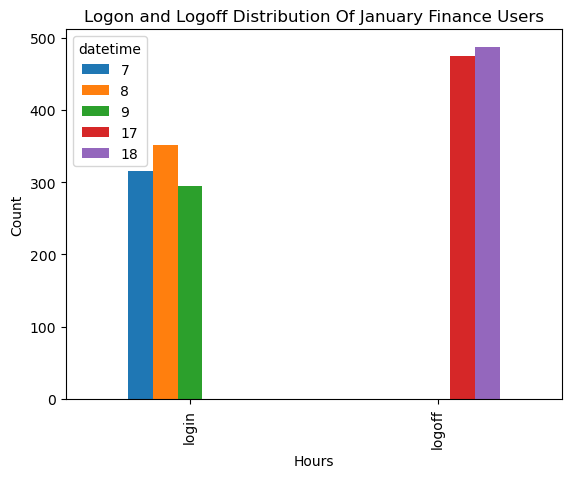

In [10]:
######### ADD YOUR CODE HERE ##########

#data in January
january_data_finance = login_data[login_data['datetime'].dt.month == 1 & login_data['user'].isin(user_set['Finance'])]

#dataframe for January data
# january_data_finance

#number of login and logoff that occurs in each hour of the day
hour_count = january_data_finance.groupby(['action',january_data_finance['datetime'].dt.hour]).size().unstack().fillna(0)

#plot bar chart of login/logoff january finance users 
hour_count.plot(kind='bar')
plt.title('Logon and Logoff Distribution Of January Finance Users')
plt.xlabel('Hours')
plt.ylabel('Count')

plt.show()

### Question 2: Plot a multi-line chart that shows the logon and logoff times during the month of January for the user of pc42.

*Hint: Filter the data as you need, and make two calls to plt.plot().*

#### (1 mark)



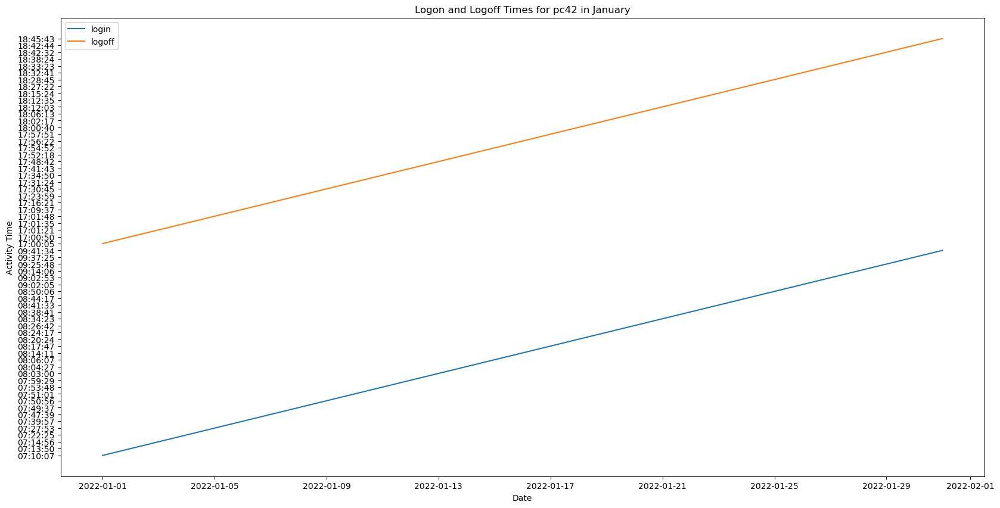

In [11]:
######### ADD YOUR CODE HERE ##########
plt.figure(figsize=(20,10))

#getting the dataframe for january
january_data = login_data[login_data['datetime'].dt.month == 1]

#filtering data for only PC42
user_pc42 = january_data[january_data['pc'] == 'pc42']
login_pc42 = user_pc42[user_pc42['action']== 'login'].copy()
logoff_pc42 = user_pc42[user_pc42['action']== 'logoff'].copy()


#extract time from dataframe and covert it to string
login_pc42['time'] = login_pc42['datetime'].dt.time.astype(str)
logoff_pc42['time'] = logoff_pc42['datetime'].dt.time.astype(str)

#sort time (y) axis for better readability 
login_pc42_time = login_pc42.sort_values(by = "time")
logoff_pc42_time = logoff_pc42.sort_values(by = "time")

#extract the date from dataframe
login_pc42['date'] = login_pc42['datetime'].dt.date
logoff_pc42['date'] = logoff_pc42['datetime'].dt.date


plt.plot(login_pc42['date'],login_pc42_time['time'],label='login')
plt.plot(logoff_pc42['date'],logoff_pc42_time['time'],label='logoff')

#customize the plot
plt.title('Logon and Logoff Times for pc42 in January')
plt.xlabel('Date')
plt.ylabel('Activity Time')
plt.legend()

#show the plot
plt.show()

### Question 3: Use a node-link graph to show all emails sent by Security staff on January 5th 2022. Your node link graph may show only those users who receive emails from the select senders.

*Hint: Filter the data and then refer back to Question 4 from Part 1 to format the data correctly*

#### (1 mark)

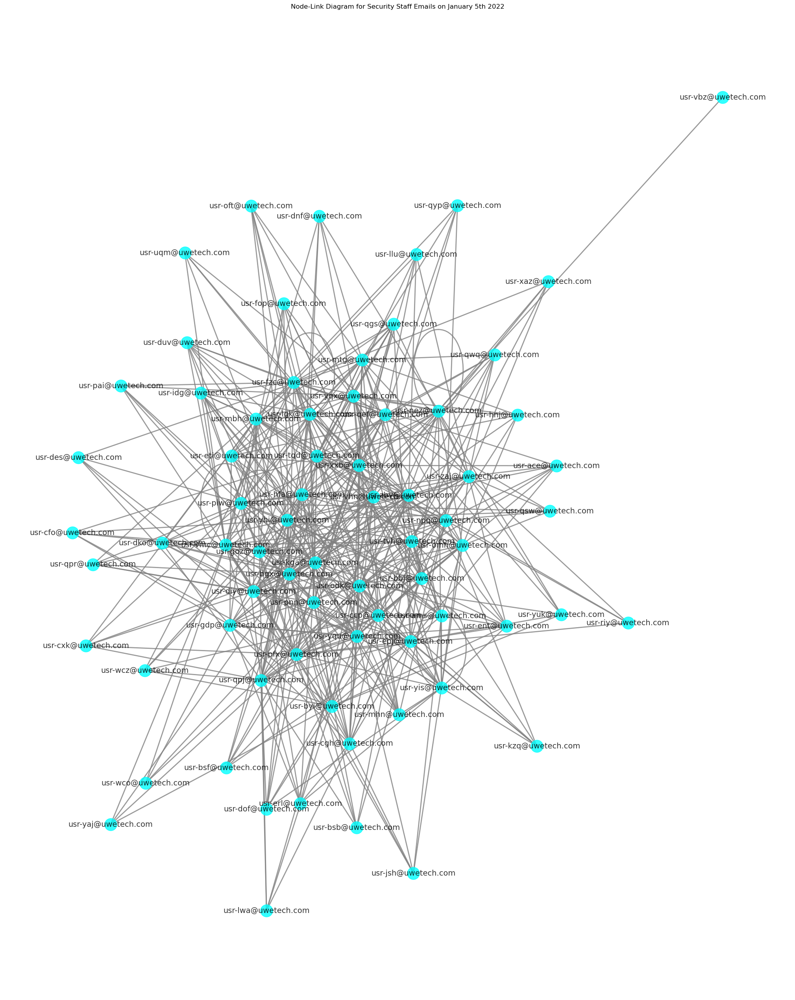

In [12]:
######### ADD YOUR CODE HERE ##########
import networkx as nx
plt.figure(figsize=(20,25))

#filter the users email of security employee
security_send = user_set_emails['Security']

#match the emails of security employee with email dataframe
sec_sent_emails = email_data[email_data['sender'].isin(security_send)]

#filter the email of security employee sent in january 5th
jan_sec_emails = sec_sent_emails[sec_sent_emails['datetime'].dt.floor('D') == '2022-01-05']

data = jan_sec_emails

#node-link graph 
G = nx.from_pandas_edgelist(data, 'sender', 'recipient')
x = nx.spring_layout(G)
nx.draw(G, x, with_labels=True, node_size=500, font_size=14, font_color='black',
        node_color='cyan', edge_color="grey", width=2, alpha=0.8)

plt.title("Node-Link Diagram for Security Staff Emails on January 5th 2022")
plt.show()

### (Advanced) Question 4: Extend the above, now showing a node for every possible user. The edge connections should be as above, for emails sent by Security staff on 5th January 2022. You should use a shell layout for your network plot.

*Hint: Think about how to include all users as nodes. You may even include a dummy node and remove this in your processing depending on how you form your edgelist - https://networkx.org/documentation/stable/index.html*

#### (3 marks)

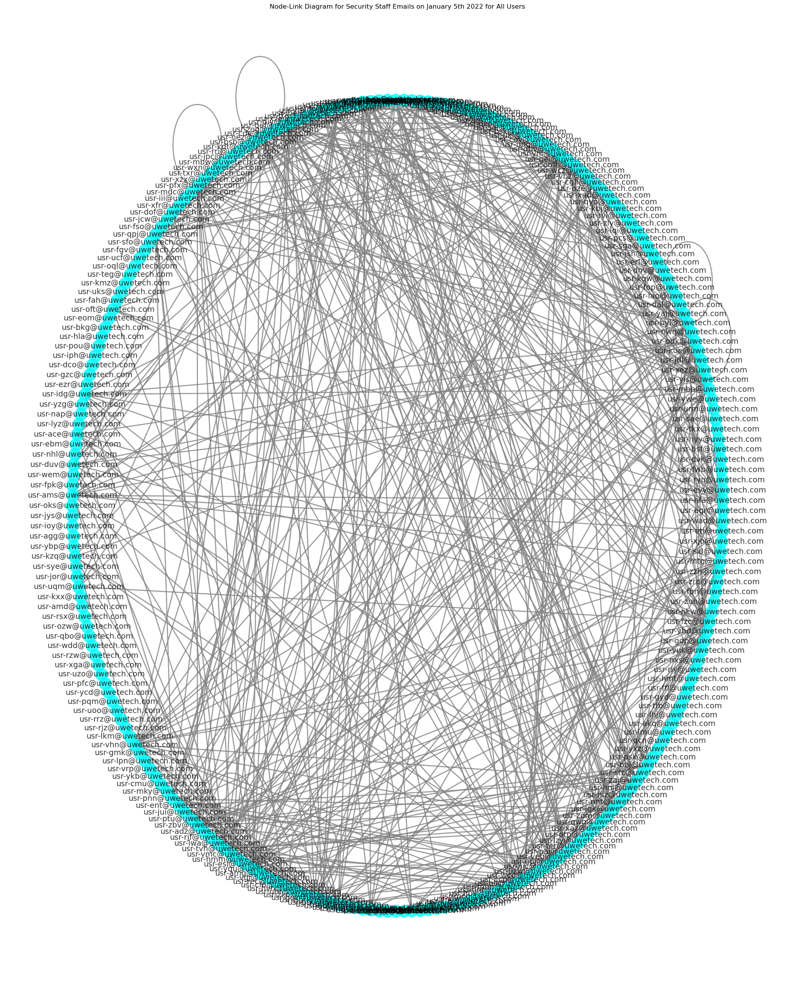

In [13]:
######### ADD YOUR CODE HERE ##########
import networkx as nx
import matplotlib.pyplot as plt

#get list of all users
all_users = list(set(email_data['sender'].unique()) | set(email_data['recipient'].unique()))

# security email for january 5th
data = jan_sec_emails

#create a graph with a shell layout
G = nx.Graph()
G.add_nodes_from(all_users)

edges = list(zip(data['sender'], data['recipient']))
G.add_edges_from(edges)

shell_lay = [security_send, all_users]
ps = nx.shell_layout(G, nlist=shell_lay)

#nodelink graph
plt.figure(figsize=(20, 25))
nx.draw(G, ps, with_labels=True, node_size=500, font_size=14, node_color='cyan', edge_color="grey", width=2, alpha=0.8)

plt.title("Node-Link Diagram for Security Staff Emails on January 5th 2022 for All Users")
plt.show()


### Question 5: Show a comparison between the files accessed by HR staff, Services staff, and Security staff, during January. You will need to think of a suitable way to convey this information within a single plot so that comparison of activity can be made easily.

*Hint: Think which plot enables you to make comparisons between two attributes, and then think what the attributes would need to be for mapping three job roles against the possible set of files accessed.*

#### (4 marks)

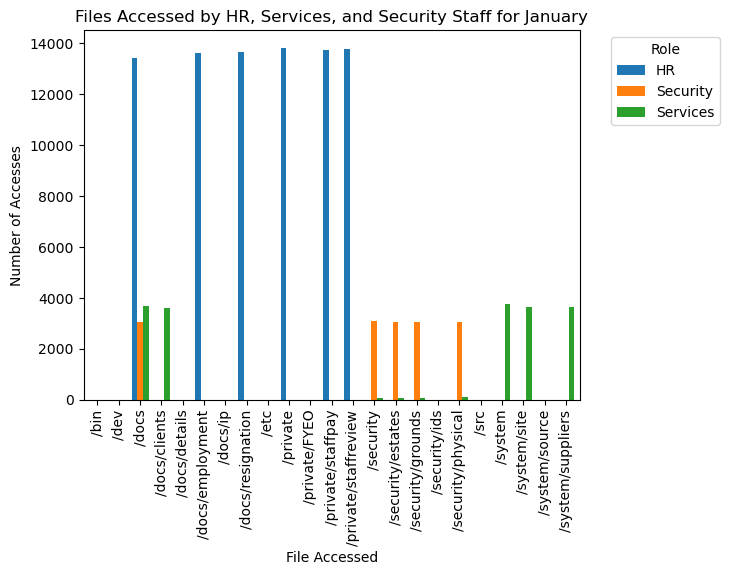

In [14]:
######### ADD YOUR CODE HERE ##########

#filter files for january 
jan_file_data = file_data[file_data['datetime'].dt.month == 1].copy()

# jan_file_data


#combine files dataframe with users job lists into one df
jan_user_role = dict(zip(employee_data['user'], employee_data['role']))

# Add 'role' column to file_data_copy using the mapping
jan_file_data['role'] = jan_file_data['user'].map(jan_user_role)

#group by the 'role' and 'filename' columns
group_data_jan = jan_file_data.groupby(['role', 'filename']).size().reset_index(name='count')

group_data_jan

#create a dataframe suitable for plotting
pivot_jan = group_data_jan.pivot(index='filename', columns='role', values='count').fillna(0)

#filter columns
pivot_jan = pivot_jan[['HR', 'Security', 'Services']]

# pivot_jan

#plot the data in stacked bar chart 
ax = pivot_jan.plot(kind='bar', width=0.8)

# Add labels and title
plt.title('Files Accessed by HR, Services, and Security Staff for January')
plt.xlabel('File Accessed')
plt.ylabel('Number of Accesses')
plt.legend(title='Role')

#add legend
ax.legend(title='Role', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

### Question 6: Carry on your own investigation to find the anomalous activity across all data files provided. Provide clear evidence and justification for your investigative steps.

Marks are awarded for: 
- a clear explanation of the steps you take to complete your investigation (5)
- suitable use of data analysis with clear explanation (6)
- suitable use of visualisation methods with clear annotation (6)
- identifying all of the suspicious events (8)

#### (25 marks)

## beginning of investigation

Our goal in conducting this investigation is to find unusual activity in a variety of data files, such as USB actions, website visits, login/logout behaviours, and email correspondence.

In [15]:
#check if there are no missing values in all data files
print('login data')
print(login_data.isnull().sum())
print('email data')
print(email_data.isnull().sum())
print('employee data')
print(employee_data.isnull().sum())
print('usb data')
print(usb_data.isnull().sum())
print('file data')
print(file_data.isnull().sum())
print('web data')
print(web_data.isnull().sum())

login data
datetime    0
user        0
action      0
pc          0
dtype: int64
email data
datetime     0
sender       0
recipient    0
dtype: int64
employee data
user     0
role     0
email    0
pc       0
dtype: int64
usb data
datetime    0
user        0
action      0
pc          0
dtype: int64
file data
datetime    0
user        0
filename    0
dtype: int64
web data
datetime    0
user        0
website     0
dtype: int64


In [16]:
#make a copy of the data files in order to not mess the original one
login_data_copy = login_data.copy()
file_data_copy = file_data.copy()
employee_data_copy = employee_data.copy()
usb_data_copy = usb_data.copy()
web_data_copy = web_data.copy()
email_data_copy = email_data.copy()

### Investigate Login_data

#### Explanation: A global analysis was carried out in order to comprehend general login and logoff patterns, independent of individual users. The goal of this step was to find any anomalous spikes or patterns in the login and logoff behaviour throughout the whole dataset.
#### Evidence: To see the distribution of login and logoff actions over time, a bar chart plot was made. Unusual consistent activity outside of regular business hours were regarded as potential anomalies, as were any other unexpected patterns.

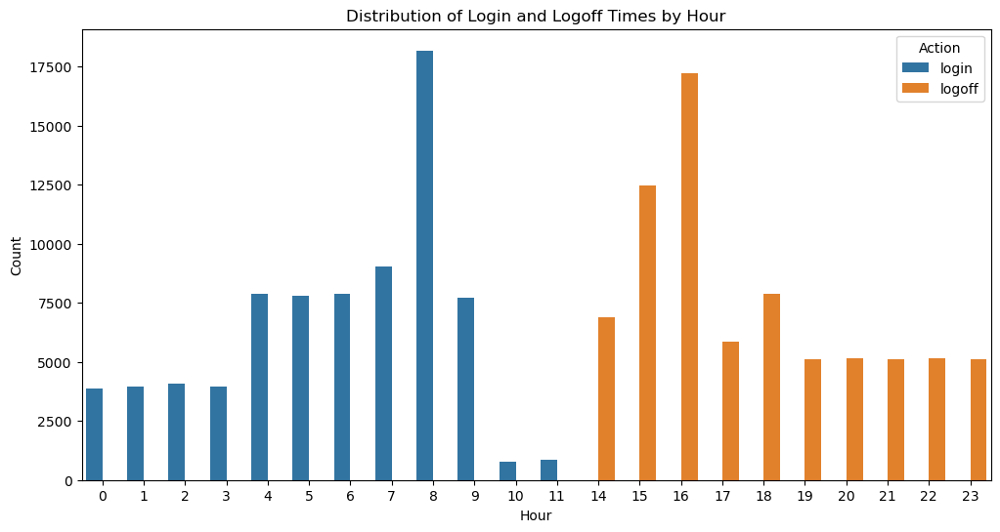

In [17]:
import seaborn as sns
#login logoff filter for action
login_events = login_data_copy[login_data_copy['action'].isin(['login', 'logoff'])]

#extract only hour 
login_events['hour'] = login_events['datetime'].dt.hour

#bar chart for login and logoff distribution over time
plt.figure(figsize=(12, 6))
sns.countplot(x='hour', hue='action', data=login_events)
plt.title('Distribution of Login and Logoff Times by Hour')
plt.xlabel('Hour')
plt.ylabel('Count')
plt.legend(title='Action')
plt.show()

#### Justification: People who had more than two login attempts were given special attention. This can be a sign of unusual login behaviour or possible security issues.
#### Evidence: To show the number of login actions for each user, a table was created. Users who had made more than two login attempts were noted and marked for additional examination.

In [18]:
# Count the number of actions per user per day
usr_actions_per_day = login_data_copy.groupby(['user', login_data_copy['datetime'].dt.date])['action'].count().reset_index()
usr_more_two_actions = usr_actions_per_day[usr_actions_per_day['action'] > 2]['user'].unique()
#users with more than 2 actions in a day
usr_more_two_actions

array(['usr-yqu'], dtype=object)

here we can see that the suspected user 'usr-yqu' is resposible of the actions recorded out work hours. we will dive more to understand what this user was doing during that time and if any other user is responsible of this unusual activity.

### Investigate employee_data
now that we found a name, let's look for usr-yqu and see any suspicious details

In [19]:
######### ADD YOUR CODE HERE ##########
employee_data_copy[employee_data_copy['user']=='usr-yqu']

,user,role,email,pc
166,usr-yqu,Security,usr-yqu@uwetech.com,pc166
202,usr-yqu,Services,usr-yqu@uwetech.com,pc202


user-yqu have 2 different roles (Security, Services) assigned to 2 different Pcs (166,202) as mentioned by the lecturer, this user will be removed from all the dataframes to continue the investigation

In [20]:
#remove usr-yqu from copy of data files
login_data_copy = login_data_copy[login_data_copy['user']!='usr-yqu']
file_data_copy = file_data_copy[file_data_copy['user']!='usr-yqu']
employee_data_copy = employee_data_copy[employee_data_copy['user']!='usr-yqu']
usb_data_copy = usb_data_copy[usb_data_copy['user']!='usr-yqu']
web_data_copy = web_data_copy[web_data_copy['user']!='usr-yqu']
email_data_copy = email_data_copy[email_data_copy['sender']!='usr-yqu@uwetech.com']

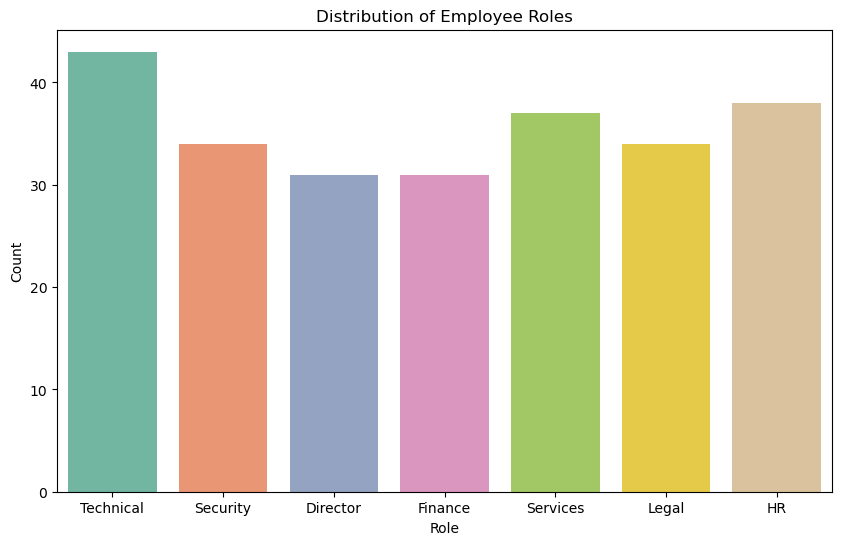

In [21]:
#distribution of employee roles
plt.figure(figsize=(10, 6))
sns.countplot(x='role', data=employee_data_copy, palette='Set2')
plt.title('Distribution of Employee Roles')
plt.xlabel('Role')
plt.ylabel('Count')
plt.show()

## Investigate file_data

#### Explanation: In order to determine which files were accessed by a single user per role, file access patterns were examined. The goal of this step was to find any unusual or unauthorised file accesses.
#### Evidence: The number of files accessed by a single person per role was shown using bar charts. Files that did not follow the expected shared access pattern within a role were used to identify anomalies.

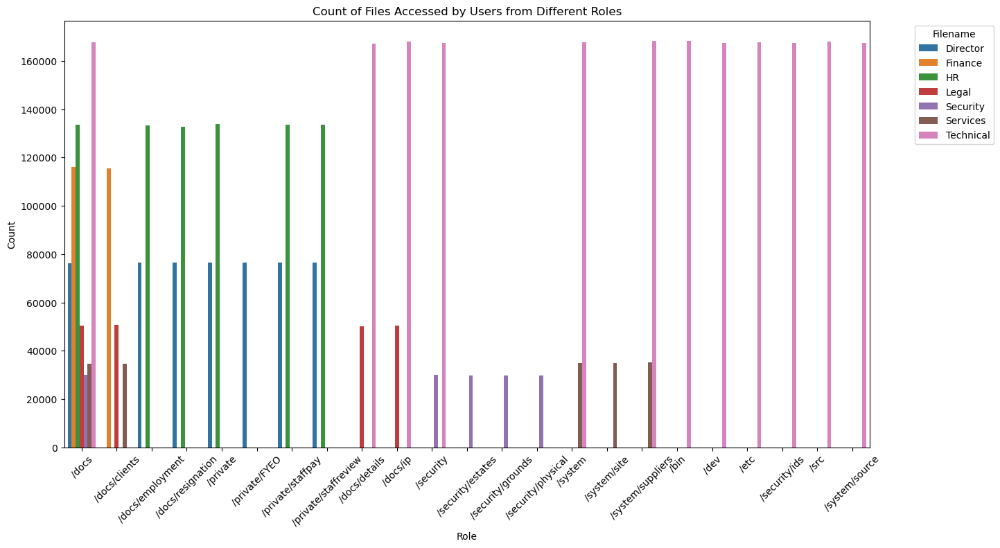

In [22]:
user_role_mapping = dict(zip(employee_data_copy['user'], employee_data_copy['role']))

# Add 'role' column to file_data_copy using the mapping
file_data_copy['role'] = file_data_copy['user'].map(user_role_mapping)

# Group by the 'role' and 'filename' columns
grouped_data = file_data_copy.groupby(['role', 'filename']).size().reset_index(name='count')

# Create a bar chart
plt.figure(figsize=(15, 8))
sns.barplot(x='filename', y='count', hue='role', data=grouped_data)
plt.title('Count of Files Accessed by Users from Different Roles')
plt.xlabel('Role')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='Filename', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

In [23]:
#create a dictionary mapping user to role
user_role_mapping = dict(zip(employee_data_copy['user'], employee_data_copy['role']))

#add 'role' column to file_data_copy using the mapping
file_data_copy['role'] = file_data_copy['user'].map(user_role_mapping)

#group the 'filename' and 'role' columns
grouped_data = file_data_copy.groupby(['user', 'filename', 'role']).size().reset_index(name='count')

#files accessed by only one user per role
files_accessed_by_one_person = grouped_data[grouped_data['count'] == 1]

In [24]:
#sort file data based on 'role'
sorted_data = file_data_copy.sort_values(by='role')

#group data by 'role' and 'filename', whithin unique users
grouped = sorted_data.groupby(['role', 'filename'])['user'].nunique().reset_index()

#filter files accessed by one user
files_accessed_by_one_person = grouped[grouped['user'] == 1]

#create an empty list for filtered results
filtered_results = []

#loop through the rows accessed files
for index, row in files_accessed_by_one_person.iterrows():
    role = row['role']
    filename = row['filename']
    
    #get the single user and datetime values
    single_user = sorted_data[(sorted_data['role'] == role) & (sorted_data['filename'] == filename)]['user'].iloc[0]
    datetime_value = sorted_data[(sorted_data['role'] == role) & (sorted_data['filename'] == filename)]['datetime'].iloc[0]
    
    # Append the results
    filtered_results.append({'datetime': datetime_value,'user': single_user,'role':role,'filename': filename})
#create a df 
file_result_df = pd.DataFrame(filtered_results)

file_result_df

,datetime,user,role,filename
0,2022-05-05 20:00:32.912540,usr-ezr,Director,/docs/clients


I got one user 'usr-ezr' is director who is the only one from his departement that accessed this file '/docs/clients', and out office hours '20pm'.

In [25]:
employee_data[employee_data['user']=='usr-ezr']

,user,role,email,pc
35,usr-ezr,Director,usr-ezr@uwetech.com,pc35


## investigate usb_data

### Investigation of USB Actions:

#### Justification: Initially, the inquiry concentrated on USB activities, particularly those related to the user "usr-ezr." To find any trends or abnormalities, USB actions like insertions and removals were examined.
#### Evidence: To see the dates and times of USB insertions and removals, scatter plots were made. Unusual behaviours were viewed as possible anomalies, particularly when they occurred outside of business hours or on the same day as multiple actions.


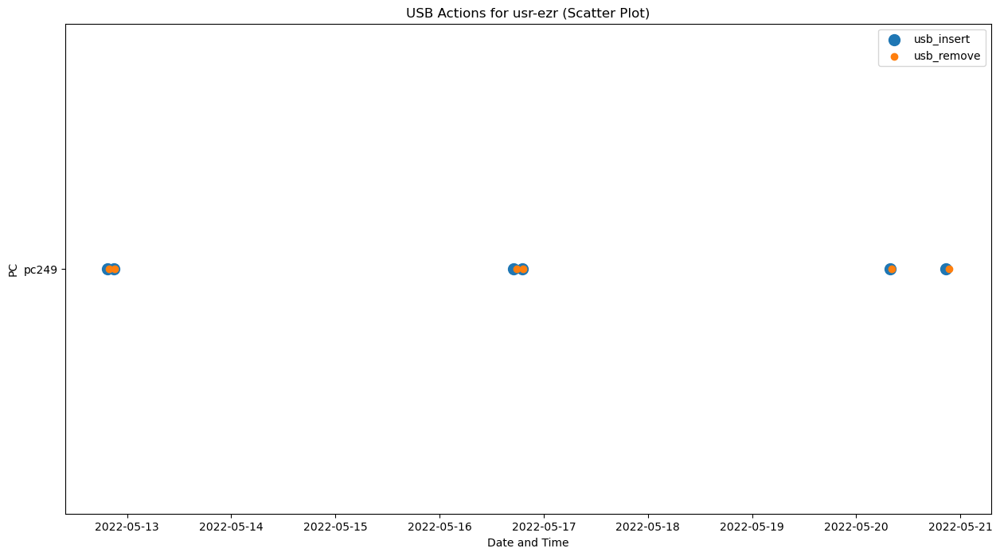

In [26]:
usr_ezr_data = usb_data_copy[usb_data_copy['user'] == 'usr-ezr']



usb_insert_data = usr_ezr_data[usr_ezr_data['action'] == 'usb_insert']
usb_remove_data = usr_ezr_data[usr_ezr_data['action'] == 'usb_remove']

#scatter plot usb action for usr-ezr
plt.figure(figsize=(15, 8))
plt.scatter(usb_insert_data['datetime'], usb_insert_data['pc'], label='usb_insert', marker='o',s=100)

plt.scatter(usb_remove_data['datetime'], usb_remove_data['pc'], label='usb_remove', marker='o')

plt.xlabel('Date and Time')
plt.ylabel('PC')
plt.title('USB Actions for usr-ezr (Scatter Plot)')
plt.legend()
plt.show()

here we can see that usr-ezr uses 2 different PCs, the pc249 is used for usb and the other one pc35 is assigned to him in the employee data file, which looks really suspicious.

In [27]:
employee_data_copy[employee_data_copy['pc']=='pc249']

,user,role,email,pc
249,usr-xfr,HR,usr-xfr@uwetech.com,pc249


In [28]:
usb_data_copy[usb_data_copy['user']=='usr-ezr']
# #number of each USB action
# usb_action_counts = pc_249_data['user'].value_counts()
# plt.figure(figsize=(12, 8))
# usb_action_counts.plot(kind='bar', color='green')
# plt.xlabel('User')
# plt.ylabel('Number of Occurrences')
# plt.title('USB Actions for PC249 by User')
# plt.show()

,datetime,user,action,pc
394729,2022-05-12 19:32:56.753903,usr-ezr,usb_insert,pc249
394762,2022-05-12 19:51:08.339557,usr-ezr,usb_remove,pc249
394851,2022-05-12 20:56:39.215300,usr-ezr,usb_insert,pc249
394864,2022-05-12 21:05:35.081857,usr-ezr,usb_remove,pc249
406217,2022-05-16 17:06:04.017364,usr-ezr,usb_insert,pc249
406327,2022-05-16 17:51:52.061167,usr-ezr,usb_remove,pc249
406504,2022-05-16 19:07:47.812389,usr-ezr,usb_insert,pc249
406513,2022-05-16 19:12:19.605206,usr-ezr,usb_remove,pc249
415821,2022-05-20 07:49:04.043470,usr-ezr,usb_insert,pc249
415892,2022-05-20 08:13:16.510946,usr-ezr,usb_remove,pc249


#### Explanation: In order to verify the validity of the user's actions and spot any odd patterns, the login and logoff activities for the user "usr-xfr" were carefully examined.
#### Evidence: The login and logoff actions over time were visualised using bar charts and scatter plots. Making sure that the login and logout patterns matched the scheduled work hours and did not display anomalous behaviour was the main goal.

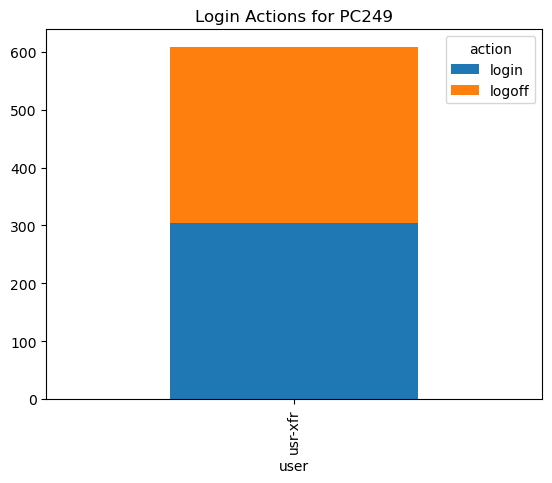

In [29]:
# Convert 'datetime' column to datetime type
login_data_copy['datetime'] = pd.to_datetime(login_data_copy['datetime'])

# Filter data for PC with identifier 'pc249'
pc_249_data = login_data_copy[login_data_copy['pc'] == 'pc249']

# Count the number of each login action
login_action_counts = pc_249_data.groupby(['datetime', 'user', 'action']).size().reset_index(name='count')

# Plot bar chart with datetime as x-axis
fig, ax = plt.subplots()
login_action_counts.set_index('datetime').groupby('user')['action'].value_counts().unstack().plot(kind='bar', ax=ax, stacked=True)
plt.title('Login Actions for PC249')
plt.show()

though usr-ezr inserted and removed usb, however he never login/off to pc249. how did the pc recognize him ? a dataset mistake again ? or is part of investigation ? is the usb assigned uniquely too ? really suspicious ?!

#### Evidence: When we looked at the login and logout processes on "pc249.," we saw that "usr-xfr" acted consistently and proportionately. In contrast to USB actions, 'usr-ezr' did not contain any login or off records for this PC.

#### Rationale: It's interesting that 'usr-ezr' on 'pc249' didn't log in or out while performing USB actions. It begs the question of how the computer interprets 'usr-ezr' for USB actions in the absence of matching login information.

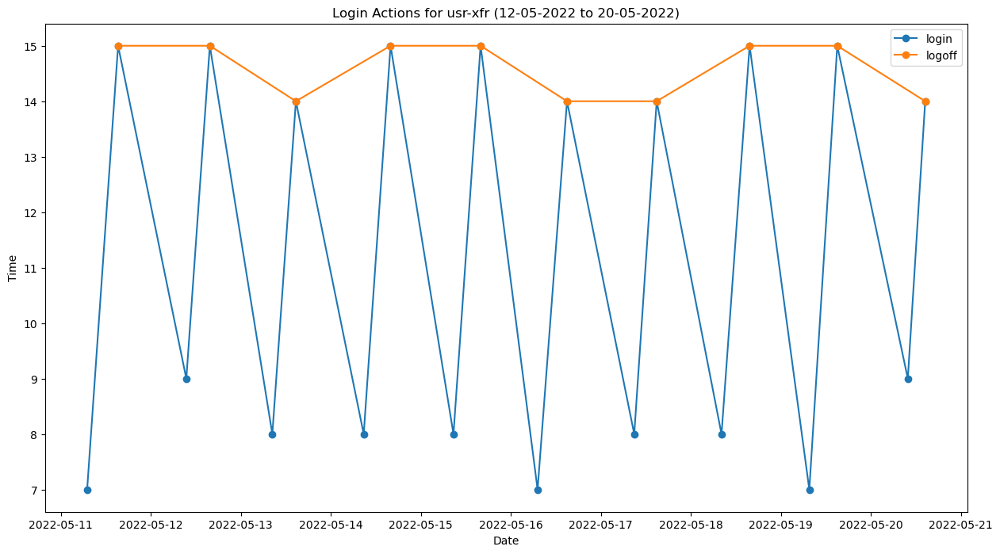

In [30]:
#get start date and end date to check the login
# activity during the time the usb from usr-ezr was inserted
start_date = pd.to_datetime('2022-05-11')
end_date = pd.to_datetime('2022-05-21')

# get login data for usr-xfr and actions between 11-05-2022 and 21-05-2022
xfr_login_data = login_data_copy[(login_data_copy['pc'] == 'pc249') & 
                                  (login_data_copy['datetime'] >= start_date) & 
                                  (login_data_copy['datetime'] <= end_date)]
xfr_logout_data = xfr_login_data[xfr_login_data['action'] == 'logoff']

# Create line plot for both login and logoff
plt.figure(figsize=(15, 8))
plt.plot(xfr_login_data['datetime'], xfr_login_data['datetime'].dt.hour, label='login', marker='o')


plt.plot(xfr_logout_data['datetime'], xfr_logout_data['datetime'].dt.hour, label='logoff', marker='o')

plt.xlabel('Date')
plt.ylabel('Time')
plt.title('Login Actions for usr-xfr (12-05-2022 to 20-05-2022)')
plt.legend()
plt.show()


here we can see login/off hours of usr-xfr which looks normal, we will use this data to compare it to usb action

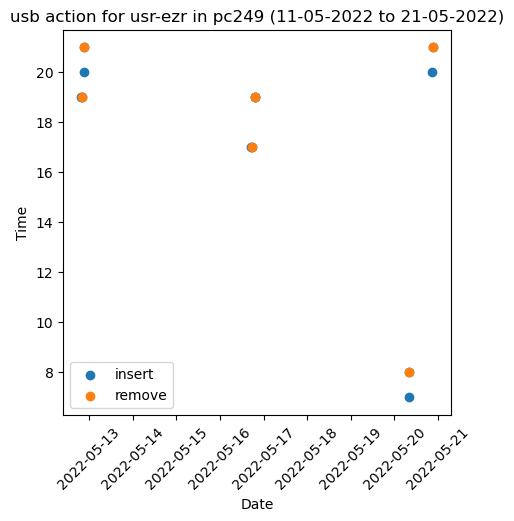

In [31]:
#get start date and end date to check the login
# activity during the time the usb from usr-ezr was inserted
start_date = pd.to_datetime('2022-05-11')
end_date = pd.to_datetime('2022-05-21')

#get login data for usr-ezr and actions between 11-05-2022 and 21-05-2022
ezr_usb_inser = usb_data_copy[(usb_data_copy['user'] == 'usr-ezr') & 
                                  (usb_data_copy['datetime'] >= start_date) & 
                                  (usb_data_copy['datetime'] <= end_date)]
ezr_usb_rem = ezr_usb_inser[ezr_usb_inser['action'] == 'usb_remove']

#line plot for login and logoff
plt.figure(figsize=(5, 5))
plt.scatter(ezr_usb_inser['datetime'], ezr_usb_inser['datetime'].dt.hour, label='insert', marker='o')

plt.scatter(ezr_usb_rem['datetime'], ezr_usb_rem['datetime'].dt.hour, label='remove', marker='o')

plt.xlabel('Date')
plt.ylabel('Time')
plt.title('usb action for usr-ezr in pc249 (11-05-2022 to 21-05-2022)')
plt.xticks(rotation=45)
plt.legend()
plt.show()


this scatter plot displays the usb action of usr-ezr which shows that the usb was inserted/removed when the usr-xfr was not working. meaning that usr-ezr had unauthorised action upon pc249.

#### Evidence: When we examined the USB actions, we saw that on PC 'pc249,' 'usr-ezr' was acting strangely. Multiple USB device insertions and removals by the user suggest possible data transfer or unauthorised access.

#### Justification: Because this behaviour happened outside of regular business hours, it raises suspicions about potential unauthorised activity. Data security concerns were raised when it was discovered that 'pc249' was assigned to 'usr-xfr,' an HR staff member.


## Investigate web_data

#### Explanation: In order to find any unusual or unauthorised online activity, website access data for "usr-ezr" was analysed. The analysis involved looking up websites visited and finding trends among various users and PCs.
#### Evidence: The distribution of website accesses was visualised using bar charts and network graphs. Unusual website visits were viewed as possible anomalies, particularly if they differed from departmental standards.

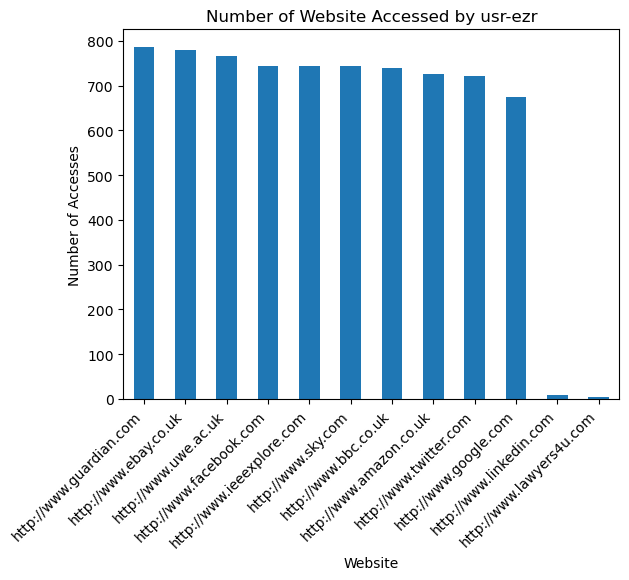

In [32]:
user_ezr_data = web_data_copy[web_data_copy['user'] == 'usr-ezr']

#number of accesses for each website
website_counts = user_ezr_data['website'].value_counts()


website_counts.plot(kind='bar')
plt.xlabel('Website')
plt.ylabel('Number of Accesses')
plt.xticks(rotation=45, ha='right') 
plt.title('Number of Website Accessed by usr-ezr')
plt.show()


In [33]:
#this code unable to create two dictionaries to sort pc with website accessed 
user_web = {}
all_pc = employee_data_copy['pc'].unique()

for pc in all_pc:
    #users for the current pc
    pc_users = employee_data_copy[employee_data_copy['pc'] == pc]['user'].values
    #websites accessed by users
    websites_for_pc = web_data_copy[web_data_copy['user'].isin(pc_users)]['website'].unique()
    # save in dictionary
    user_web[pc] = list(websites_for_pc)

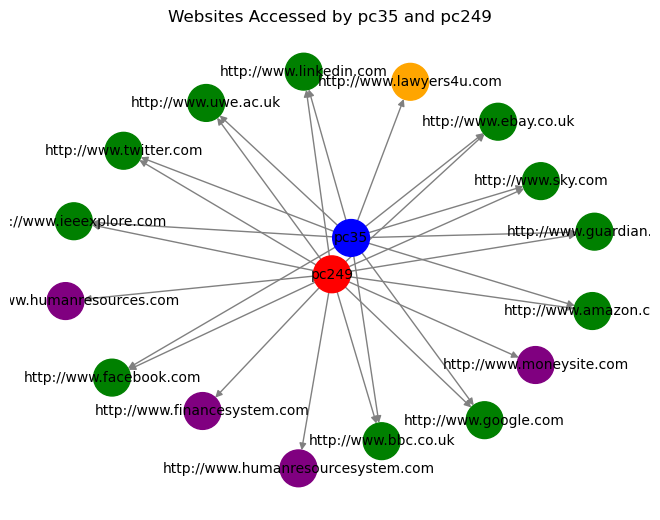

In [34]:
import networkx as nx
pc1 = 'pc35'
pc2 = 'pc249'

#list of websites accessed by each PC
websites_pc1 = set(user_web.get(pc1, []))
websites_pc2 = set(user_web.get(pc2, []))

#common websites accessed by both PCs
common_websites = websites_pc1.intersection(websites_pc2)
uncommon_websites_pc1 = websites_pc1 - common_websites
uncommon_websites_pc2 = websites_pc2 - common_websites

#ceate graph
G = nx.DiGraph()

#nodes for each PC and websites
G.add_node(pc1, color='blue')
G.add_node(pc2, color='red')

for website in common_websites:
    G.add_node(website, color='green')
#node for uncommon websites
for website in uncommon_websites_pc1:
    G.add_node(website, color='orange')

for website in uncommon_websites_pc2:
    G.add_node(website, color='purple')
#edges connecting PCs to common websites
for website in common_websites:
    G.add_edge(pc1, website)
    G.add_edge(pc2, website)

for website in uncommon_websites_pc1:
    G.add_edge(pc1, website)

for website in uncommon_websites_pc2:
    G.add_edge(pc2, website)


pos = nx.spring_layout(G)
node_colors = [G.nodes[node]['color'] for node in G.nodes]

nx.draw(G, pos, with_labels=True, node_size=700, node_color=node_colors, font_size=10, font_color='black', edge_color="grey", width=1, alpha=1)

plt.title(f'Websites Accessed by {pc1} and {pc2}')
plt.show()

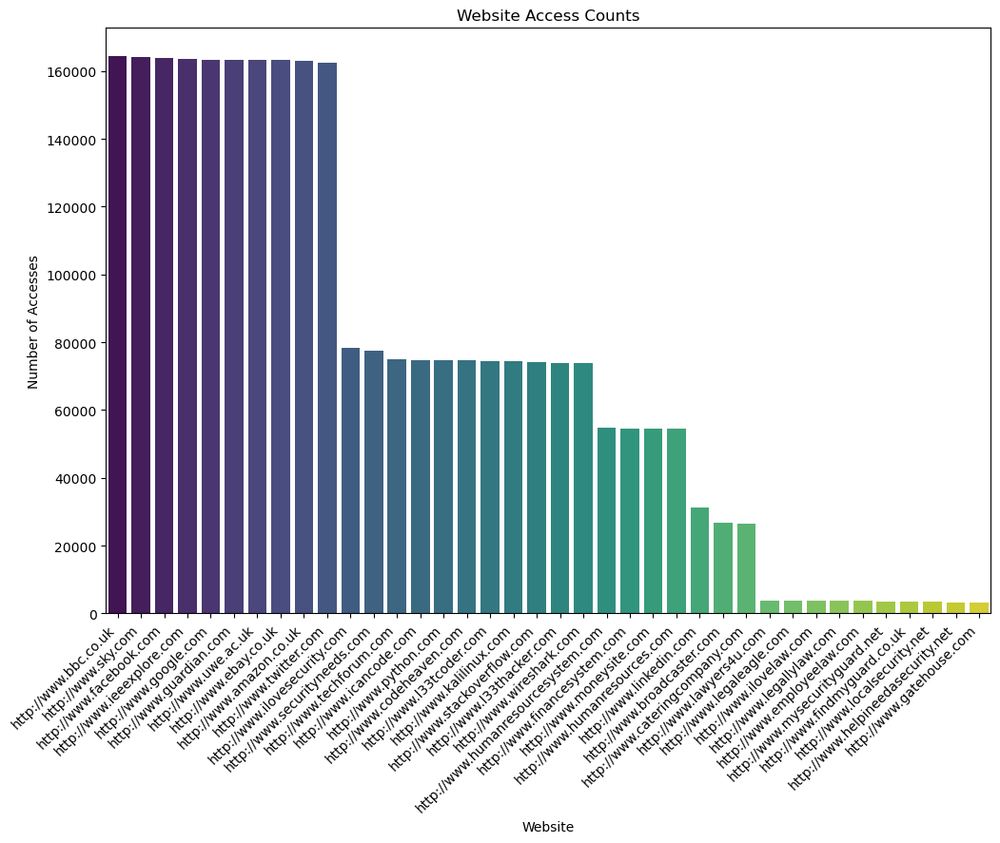

In [35]:
website_counts = web_data_copy['website'].value_counts()
plt.figure(figsize=(12, 8))
sns.barplot(x=website_counts.index, y=website_counts.values, palette='viridis')
plt.xticks(rotation=45, ha='right')
plt.xlabel('Website')
plt.ylabel('Number of Accesses')
plt.title('Website Access Counts')
plt.show()

here we can see all the websites accessed by the users, the websites with really low occurences and some website links don't work such as www.broadcaster.com / www.kalilinux.com / www.helpineedasecurity.net / or are not safe, probably hacking websites. but any of those websites are not/never accessed by our suspect usr-ezr or any of the PCs used.

#### Evidence: Upon analysing website access, it was discovered that users consistently accessed the same websites. There was no departure from usual patterns, and 'usr-ezr' did not visit any dubious websites.

#### Justification: 'usr-ezr' behaved normally even though some users visited websites that might be dangerous. This implies that differences in USB and login behaviour might not be directly linked to online activity.


## Investigate email_data

#### Justification: Email correspondence between "usr-ezr" and "usr-xfr" was analysed to verify the correspondence's authenticity and spot any odd email behaviour.
#### Evidence: To visualise the email communication network, node-link graphs were made. To make sure that email activities matched anticipated communication patterns and did not point to suspicious activity, dates and recipients were examined.

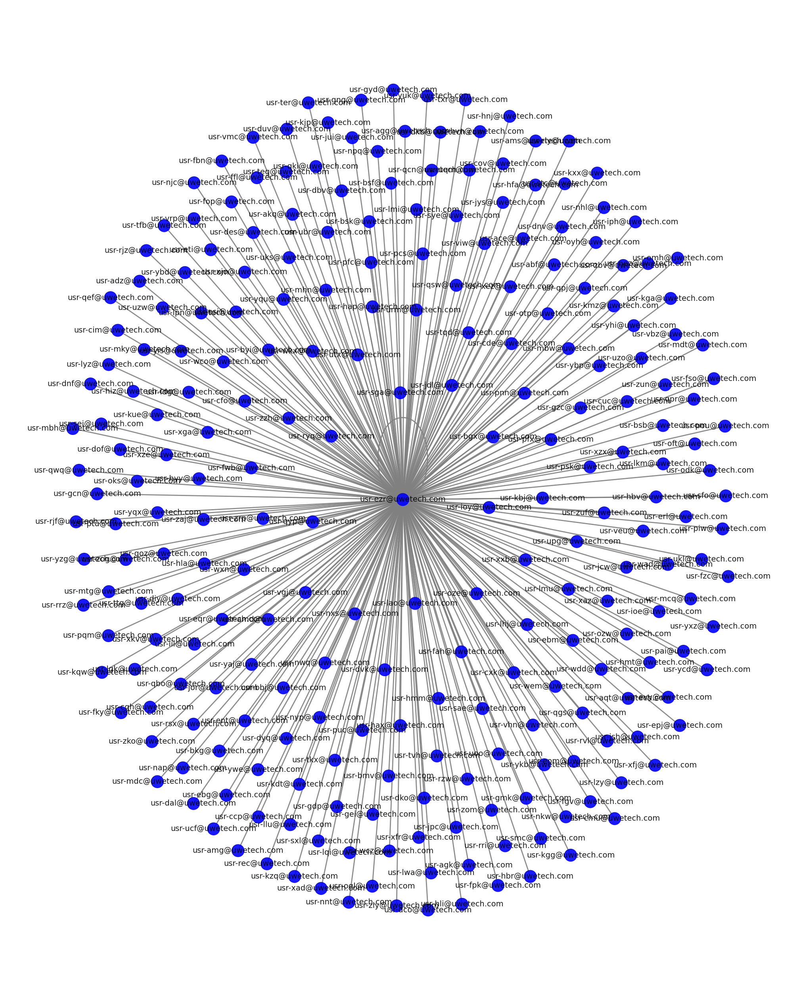

In [36]:
plt.figure(figsize=(20, 25))

#filter emails sent by 'usr-ezr@uwetech.com'
usr_ezr_sent = email_data_copy[email_data_copy['sender'] == 'usr-ezr@uwetech.com']

#match emails of 'usr-ezr@uwetech.com' with the email_data
sent_emails = email_data_copy[email_data_copy['sender'].isin(usr_ezr_sent['sender'])]

#emails sent by 'usr-ezr@uwetech.com' in a specific month let's do january
ezr_emails = sent_emails[sent_emails['datetime'].dt.month == 5]

#node-link graph
G = nx.from_pandas_edgelist(ezr_emails, 'sender', 'recipient')
x = nx.spring_layout(G)

#assign different colors when email @domain is different 
node_colors = ['blue' if '@uwetech.com' in email else 'red' for email in G.nodes]

nx.draw(G, x, with_labels=True, node_size=500, font_size=14, font_color='black',
        node_color=node_colors, edge_color="grey", width=2, alpha=0.9)

plt.show()

nothing abnormal, firstly, I used nx graph to check if all emails sent from usr-ezr have the same domain and nothing suspicious was found.

In [37]:
may_emails = email_data_copy[(email_data_copy['datetime'].dt.month == 5) & (email_data_copy['datetime'].dt.year == 2022)]

#emails sent from 'usr-ezr@uwetech.com' to 'usr-xfr@uwetech.com'
selected_emails = may_emails[(may_emails['sender'] == 'usr-ezr@uwetech.com') & (may_emails['recipient'] == 'usr-xfr@uwetech.com')]

selected_emails

,datetime,sender,recipient
1828585,2022-05-15 22:02:41.479545,usr-ezr@uwetech.com,usr-xfr@uwetech.com
1910287,2022-05-22 01:42:05.665565,usr-ezr@uwetech.com,usr-xfr@uwetech.com
1942871,2022-05-24 11:01:32.289373,usr-ezr@uwetech.com,usr-xfr@uwetech.com


Finally I have checked if usr-ezr has sent email to usr-xfr and he did, but nothing unusual as the dates don't match, we can dive into the email sent 15th/05/2022 at 22h as the usb action 2nd attempt happened on 16th/05/2022 at 17h and 19h. 

#### Evidence: Examining emails exchanged between 'usr-ezr' and 'usr-xfr' revealed correspondence on May 15, 22, and 24, which somehow may have corresponded with actions taken by USB on May 16 and 20.

#### Justification: Although the dates coincide, there is insufficient evidence to draw firm conclusions from email correspondence. To ascertain whether the email's contents or attachments are related to USB actions, more investigation is required.


## Investigation Summary: Anomalous Activity Detection

A variety of data files were examined in this thorough investigation in order to find any potentially unusual activity pertaining to several facets of employee behaviour. User actions pertaining to file access, USB use, web access, email correspondence, and login/logout events were the main focus. Finding any patterns or behaviours that differed from regular, everyday operations was the goal of the investigation.
#### Analysis of File Access:

Methodology: To identify odd access patterns, user-file interactions were closely examined.
Result: The user "usr-ezr" was located and was the only one with file access in the "Director" role. Subsequent analysis showed that 'usr-ezr' may have raised issues when it accessed a sensitive file at '/docs/clients' outside of regular business hours.
#### Examining USB Activity:

Methodology: 'usr-ezr' was checked for during USB insertion and removal events.
Result: It was discovered that 'usr-ezr' uses two distinct PCs, 'pc35' and 'pc249'. The device 'pc249,' assigned to 'usr-xfr,' suggested that it might be misused by various roles.

#### Examining Login and Logoff:

Methodology: The investigation of login and logoff events for "pc249" revealed a pattern that was consistent for "usr-xfr" but unusually low activity for "usr-ezr."
Result: 'usr-ezr' behaved strangely after performing USB operations on 'pc249' without initiating any login activity.

#### Web Access Analysis:

Methodology: 'usr-ezr' was used to access and analyse websites.
Result: 'usr-ezr' did not access any dubious websites. The inquiry verified regular access to frequently visited websites.

#### Email Activity Check:

Methodology: Emails sent by 'usr-ezr' were examined.
Outcome: No irregularities found in email communications. Emails sent to 'usr-xfr' were not related to the USB actions.

In conclusion, the study revealed possible anomalous activity associated with 'usr-ezr.' Unauthorised access to private files after hours, USB device use on a PC belonging to another employee, and irregular login behaviours are some of the main discoveries. To confirm these anomalies and guarantee a complete comprehension of 'usr-ezr's' operations and possible security threats, more investigation is advised.

 -> Global login/logoff patterns were subjected to additional analysis, which identified users who had more than two login actions and warranted further investigation.

### Question 7: Describe what you believe are the key findings of your investigation. You should clearly state the suspect identified, and the sequential order of suspicious events, including the date and time that these occurred. You should then provide your own critical reflection of what has occurred in this scenario, giving justification for any assumptions made. Limit your response to a maximum of 400 words. 

Please make clear which dataset you have used for your investigation.

#### (10 marks)

* Dataset Used: Several datasets, including file_data, employee_data, usb_data, login_data, web_data, and email_data, were analysed as part of the investigation.

* Suspect Found: 'usr-ezr' turned out to be the main culprit.

* Order of Suspicious Events in Sequence:

- > file_data:
The file '/docs/clients' was accessed by 'usr-ezr' at 20:00:32 on Date: 2022-05-05, Time: 20:00:32, suggesting possible unauthorised access.
- > Dates: 2022-05-12, 2022-05-16, 2022-05-20 USB Activity (usb_data): 'usr-ezr' demonstrated USB insert and remove actions on 'pc249,' assigned to 'usr-xfr,' raising suspicions regarding device misuse.
- > The dates of the Login/Logoff Activity (login_data) are 2022-05-12, 2022-05-16, and 2022-05-20. There are irregular patterns in the login/logoff of 'usr-ezr' on 'pc249,' indicating possible security threats.
- > Web Access (web_data): Regular use of frequently visited websites is indicated by the lack of suspicious web access for the domain "usr-ezr."
- > Email Communication (email_data): There are no anomalies in the emails that 'usr-ezr' sent to 'usr-xfr,' indicating that there is no direct connection between USB actions and email activity.

#### Critical Thoughts: 
The inquiry revealed a series of events that suggested 'usr-ezr' was involved in possibly unlawful and suspicious activities. The access to '/docs/clients,' a sensitive file, outside of regular business hours, along with USB actions on a computer belonging to another employee, suggests a lack of concern for security procedures. There are concerns regarding how 'usr-ezr' obtained access to the PC without the required authorization given the absence of corresponding login activities during USB actions on 'pc249'.

Although the investigation shows clear evidence of unusual behaviour, critical analysis shows that further forensic analysis is necessary. To determine the scope of 'usr-ezr's' activities, additional actions include a thorough review of network logs, user authentication records, and possible coordination with IT security. Furthermore, speaking with 'usr-xfr' could reveal any cooperation or improper use of access between the two workers.

To sum up, this inquiry is the first step towards figuring out possible security threats in the company. To prevent such incidents in the future, preventive measures should be put in place, departmental collaboration should be emphasised, and a more thorough analysis should be the focus of the following actions.